every run in this notebook has

• ridge max height of 0.7 island max height

• resolution=(64x64)

but we run through 8 cases wrt to the general geometry

• case1: Ro = 17, Rs=12, steep=0.2, W=$\pi$/5 

• case2: Ro = 17, Rs=12, steep=0.2, W=$\pi$/6 

• case3: Ro = 17, Rs=14, steep=0.2, W=$\pi$/5 

• case4: Ro = 17, Rs=14, steep=0.2, W=$\pi$/6

• case5: Ro = 20, Rs=12, steep=0.1, W=$\pi$/5 

• case6: Ro = 20, Rs=12, steep=0.1, W=$\pi$/6 

• case7: Ro = 20, Rs=14, steep=0.1, W=$\pi$/5 

• case8: Ro = 20, Rs=14, steep=0.1, W=$\pi$/6


There will be two methods of classification (i) by eye (needed for mode analysis anyway) and (ii) using the percentage of kinetic energy on the ridge vs off the ridge between r=1 and r=Rs

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import dedalus.public as d3
import logging
logger = logging.getLogger(__name__)
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rc('text', usetex = True)
mpl.rc('font', family = 'serif')
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rcParams.update({'font.size': 18})


In [2]:
import xarray as xr

In [3]:
from dedalus.core.operators import SpectralOperator1D

class ComplexFourierPseudodifferential(SpectralOperator1D):

    input_basis_type = d3.ComplexFourier
    subaxis_dependence = [True]
    subaxis_coupling = [False]

    def __init__(self, operand, coord, out=None):
        super().__init__(operand, out=out)
        # SpectralOperator requirements
        self.coord = coord
        self.input_basis = operand.domain.get_basis(coord)
        self.output_basis = self.input_basis
        self.first_axis = coord.axis
        self.last_axis = coord.axis
        self.axis = coord.axis
        # LinearOperator requirements
        self.operand = operand
        # FutureField requirements
        self.domain = operand.domain.substitute_basis(self.input_basis, self.output_basis)
        self.tensorsig = operand.tensorsig
        self.dtype = operand.dtype

    @classmethod
    def _group_matrix(cls, group, input_basis, output_basis):
        # Rescale group (native wavenumber) to get physical wavenumber
        k = group / input_basis.COV.stretch
        # dx exp(1j*k*x) = 1j * k * exp(1j*k*x)
        return np.array([[cls.k_func(k)]])


class abs_m_cls(ComplexFourierPseudodifferential):

    name = "abs_m"

    @classmethod
    def k_func(cls, k):
        return abs(k)

    def new_operand(self, operand, **kw):
        if operand == 0:
            return 0
        return abs_m_cls(operand,  self.coord, **kw)

In [4]:
def kinetic_energy(Φg,r,θ):
    dΦ_dr = np.gradient(Φg,r,axis=1)
    dΦ_dθ = 1/r*np.gradient(Φg,np.gradient(θ)[0],axis=0)
    gradΦ = dΦ_dr + dΦ_dθ
    ke = gradΦ*np.conj(gradΦ) 
    ke = xr.DataArray(ke.real, coords=[θ,r], dims = ['theta','r']) 
    return ke

def kinetic_energy_metric(ke,Rs):
    ridge_wedge = ke.where(ke.theta<np.pi+W).where(ke.theta>np.pi-W).sum('theta')
    basin_wedge = ke.where(ke.theta>np.pi+W).fillna(0)+ke.where(ke.theta<np.pi-W).fillna(0); 
    basin_wedge = basin_wedge.where(np.abs(basin_wedge>0)).sum('theta')
    metric = (ridge_wedge/(ridge_wedge+basin_wedge)).sel(r=slice(1,Rs))
    weights = np.gradient(metric.r)/sum(np.gradient(metric.r))
    metric = float((metric*weights).sum('r').values)
    return metric

def eigenmode_plot(i,R,THETA):
    fig,(ax,ax2,ax1) = plt.subplots(1,3, figsize=(14,4),gridspec_kw={'width_ratios': [1.3,1.3,2]})    
    X = R*np.cos(THETA); Y=R*np.sin(THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g']
    Φg = (Φg-np.mean(Φg, axis=0))
    vmax=np.max(np.abs(Φg))*0.75;vmin=-vmax
    ax.pcolormesh(X,Y,Φg.real, vmin=vmin,vmax=vmax)
    ax.contour(X,Y,H, levels=[0.99,1], colors='k', alpha=0.5)
    vmax=np.max(np.abs(Φg[:,:int(Nr/8)]))*0.75;vmax=max(vmax,0.2);vmin=-vmax
    ax2.pcolormesh(X[:,:int(Nr/6)],Y[:,:int(Nr/6)],Φg.real[:,:int(Nr/6)], vmin=vmin,vmax=vmax)
    ax2.contour(X[:,:int(Nr/6)],Y[:,:int(Nr/6)],H[:,:int(Nr/6)], levels=[0.99,1], colors='k', alpha=0.5)
    for j in range(Nθ):
        ax1.plot(r, Φg.real[j,:], 'k', alpha=0.5)
        ax1.axhline(0,color='k',linestyle='dashed')
    ax.set_ylabel(r'$\omega = $ %5.4f'%(1/solver.eigenvalues.real[i]))
    ax1.set_xlabel('$r$'); ax1.set_ylabel(r'$\Phi(r,\theta)$');
    ax.set_xticks([]);ax.set_yticks([]);ax2.set_xticks([]);ax2.set_yticks([])
    fig.tight_layout()
    plt.show()

# Case \#1

Ro,Rs: 17,12

W:$\pi$/5

steep:0.2

In [5]:
## variable parameters ##
Ro = 17;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.7; ######
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1-1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [6]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:07:00,833 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 17s, Remaining: 0s, Rate: 3.9e-03/s
CPU times: user 3min 14s, sys: 1min, total: 4min 14s
Wall time: 4min 40s


In [7]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [8]:
case1_eigenvalues = 1/solver.eigenvalues.real

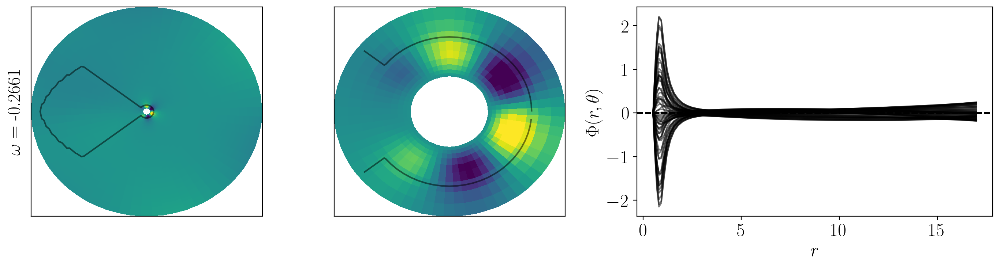

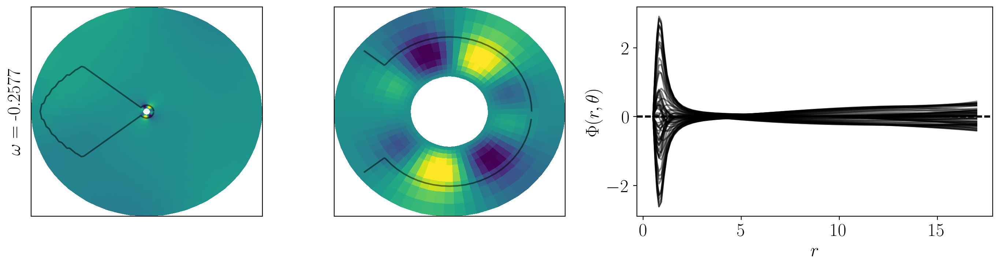

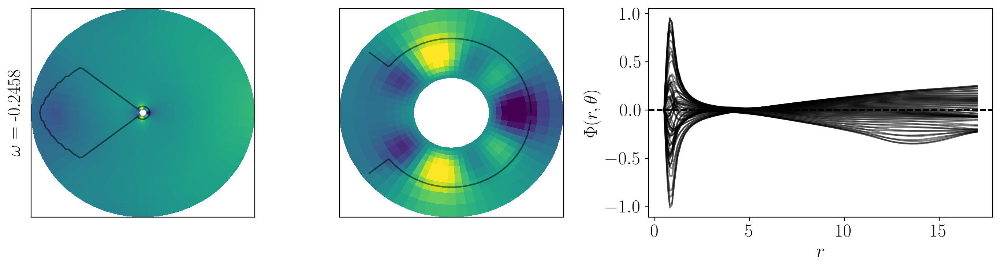

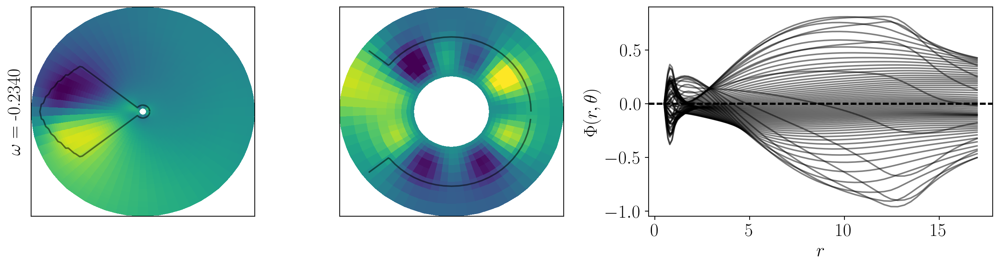

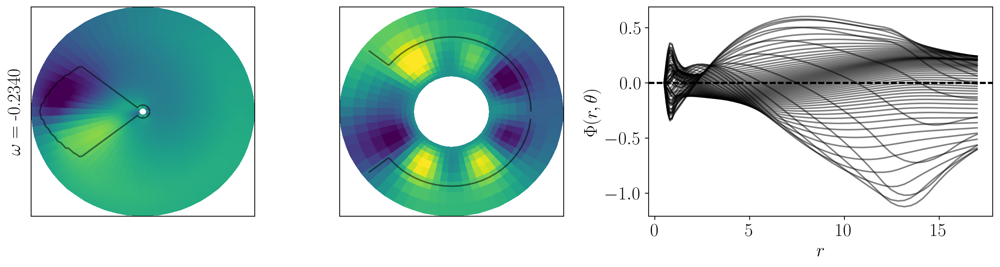

...

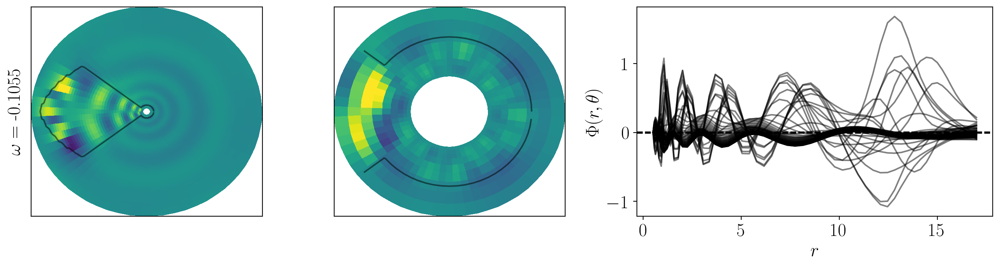

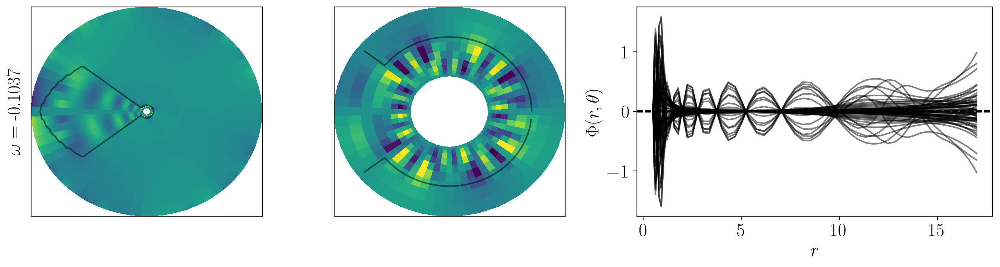

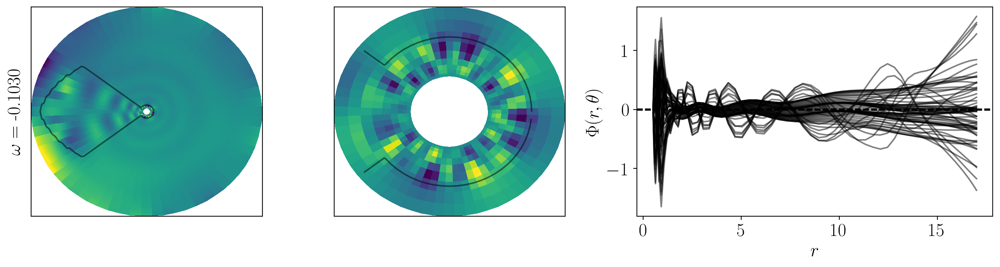

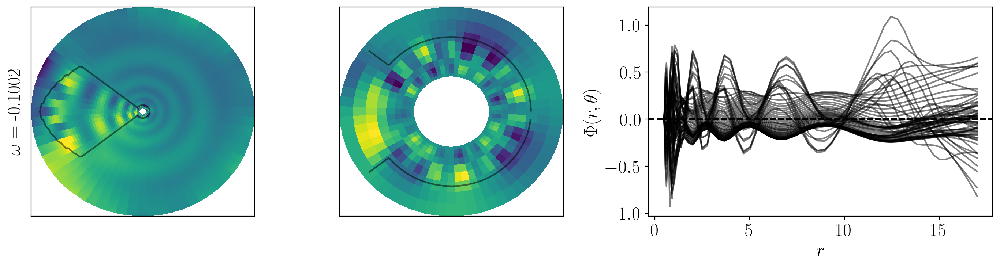

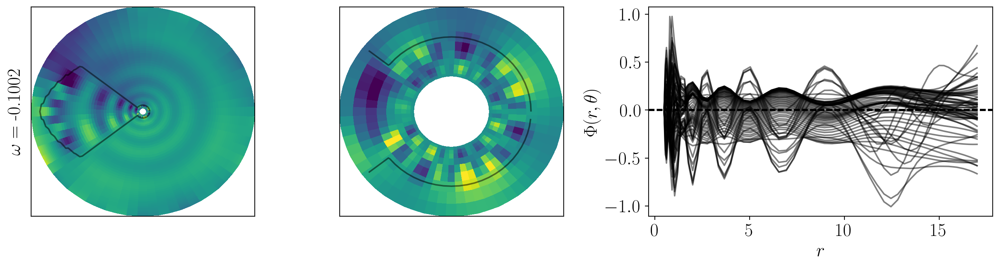

In [9]:
case1_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case1_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#2


Ro,Rs: 17,12


W:$\pi$/6

steep:0.2

In [10]:
## variable parameters ##
Ro = 17;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.7;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [11]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:12:00,896 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 25s, Remaining: 0s, Rate: 3.8e-03/s
CPU times: user 3min 14s, sys: 1min 3s, total: 4min 17s
Wall time: 4min 46s


In [12]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [13]:
case2_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case2_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case2_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#3


Ro,Rs: 17,14 

W:$\pi$/5

steep:0.2 

In [15]:
## variable parameters ##
Ro = 17;
Rs = 14;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.7;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [16]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:16:51,438 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 16s, Remaining: 0s, Rate: 3.9e-03/s
CPU times: user 3min 13s, sys: 58.9 s, total: 4min 12s
Wall time: 4min 38s


In [17]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [18]:
case3_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case3_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case3_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#4

Ro,Rs: 17,14 

W:$\pi$/6

steep:0.2 

In [20]:
## variable parameters ##
Ro = 17;
Rs = 14; 
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.7;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [21]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:21:50,961 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 25s, Remaining: 0s, Rate: 3.8e-03/s
CPU times: user 3min 16s, sys: 1min 3s, total: 4min 19s
Wall time: 4min 47s


In [22]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [23]:
case4_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case4_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case4_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#5


Ro,Rs: 20,12 

W:$\pi$/5

steep:0.1 

In [25]:
## variable parameters ##
Ro = 20;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.7;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;


#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [26]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:26:52,320 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 27s, Remaining: 0s, Rate: 3.7e-03/s
CPU times: user 3min 14s, sys: 1min 4s, total: 4min 19s
Wall time: 4min 48s


In [27]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [28]:
case5_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case5_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case5_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#6


Ro,Rs: 20,12 


W:$\pi$/6

steep:0.1 

In [30]:
## variable parameters ##
Ro = 20;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.7;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [31]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:31:55,369 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 29s, Remaining: 0s, Rate: 3.7e-03/s
CPU times: user 3min 14s, sys: 1min 2s, total: 4min 17s
Wall time: 4min 50s


In [32]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [33]:
case6_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case6_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case6_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#7

Ro,Rs: 20,14 

W:$\pi$/5

steep:0.1 

In [35]:
## variable parameters ##
Ro = 20;
Rs = 14;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.7;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [36]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:36:56,983 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 27s, Remaining: 0s, Rate: 3.8e-03/s
CPU times: user 3min 14s, sys: 1min 2s, total: 4min 17s
Wall time: 4min 48s


In [37]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [38]:
case7_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case7_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case7_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#8


Ro,Rs: 20,14 


W:$\pi$/6

steep:0.1 

In [40]:
## variable parameters ##
Ro = 20;
Rs = 14;
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.7;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [41]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 15:42:07,135 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 35s, Remaining: 0s, Rate: 3.6e-03/s
CPU times: user 3min 15s, sys: 1min 5s, total: 4min 21s
Wall time: 4min 57s


In [42]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [43]:
case8_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case8_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case8_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

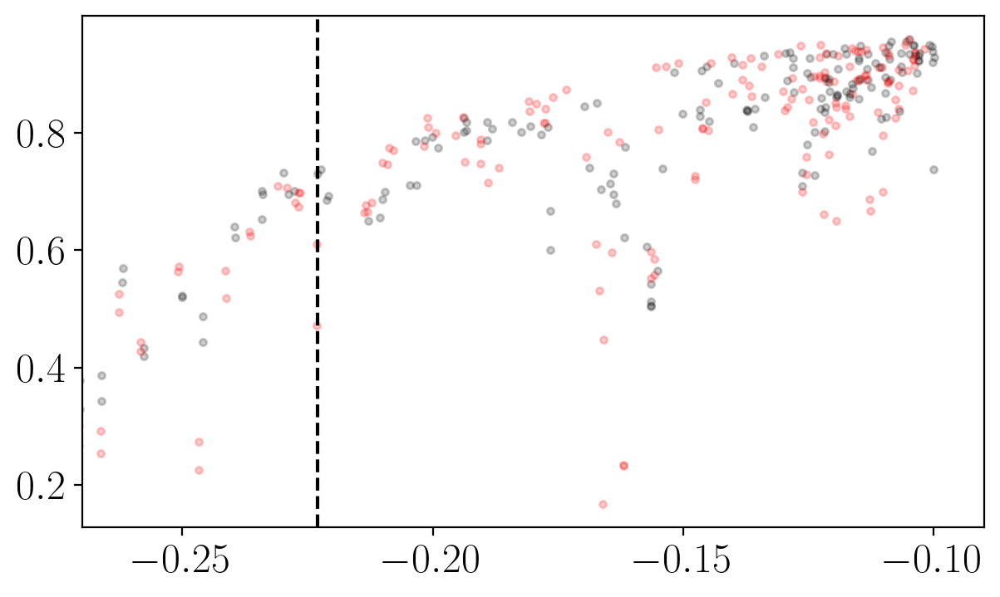

In [58]:
fig,(ax) = plt.subplots(1,1, figsize=(7,4))   
ax.plot(case1_eigenvalues, case1_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case2_eigenvalues, case2_ridge_metric, 'ro', markersize=3, alpha=0.2)
ax.plot(case3_eigenvalues, case3_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case4_eigenvalues, case4_ridge_metric, 'ro', markersize=3, alpha=0.2)
ax.plot(case5_eigenvalues, case5_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case6_eigenvalues, case6_ridge_metric, 'ro', markersize=3, alpha=0.2)
ax.plot(case7_eigenvalues, case7_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case8_eigenvalues, case8_ridge_metric, 'ro', markersize=3, alpha=0.2)
ax.set_xlim(-0.27,-0.09)
ax.axvline(-0.2230, color='k', linestyle='dashed')
plt.show()

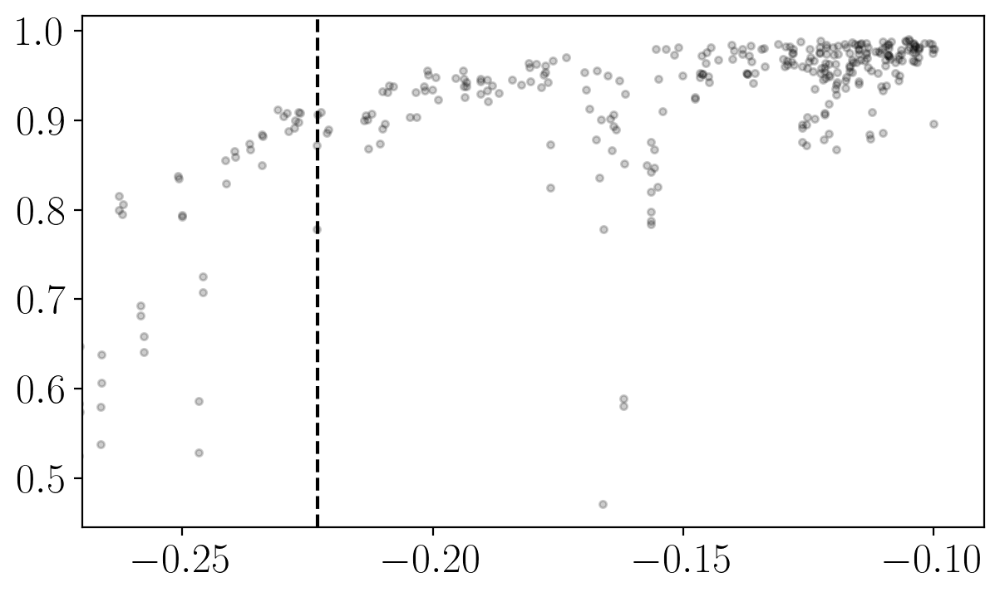

In [45]:
fig,(ax) = plt.subplots(1,1, figsize=(7,4))   
ax.plot(case1_eigenvalues, case1_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case2_eigenvalues, case2_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case3_eigenvalues, case3_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case4_eigenvalues, case4_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case5_eigenvalues, case5_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case6_eigenvalues, case6_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case7_eigenvalues, case7_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case8_eigenvalues, case8_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.set_xlim(-0.27,-0.09)
ax.axvline(-0.2230, color='k', linestyle='dashed')
plt.show()

In [46]:
eigenvalues = np.concatenate([case1_eigenvalues,case2_eigenvalues,case3_eigenvalues,case4_eigenvalues,case5_eigenvalues,case6_eigenvalues,case7_eigenvalues,case8_eigenvalues])
ke_metric   = np.concatenate([case1_ridge_metric,case2_ridge_metric,case3_ridge_metric,case4_ridge_metric,case5_ridge_metric,case6_ridge_metric,case7_ridge_metric,case8_ridge_metric])
case        = np.concatenate([np.ones(40),np.ones(40)*2,np.ones(40)*3,np.ones(40)*4,np.ones(40)*5,np.ones(40)*6,np.ones(40)*7,np.ones(40)*8 ])

In [47]:
da_eigen = xr.DataArray(eigenvalues, coords=[np.arange(len(eigenvalues))], dims=['n_eigenvalue'])
da_metric = xr.DataArray(ke_metric, coords=[np.arange(len(eigenvalues))], dims=['n_eigenvalue'])
da_case = xr.DataArray(case, coords=[np.arange(len(eigenvalues))], dims=['n_eigenvalue'])


In [48]:
da_eigen.coords['case'] = da_case
da_metric.coords['case'] = da_case

In [49]:
ds = xr.Dataset({'eigenvalues':da_eigen, 'ke_metric':da_metric})

In [50]:
ds.attrs['description'] = 'ridge_frac = 0.7'

In [51]:
ds.to_netcdf('alt_combined_config_eigenvalues_ridgefrac07.nc')